<font size="6"> Machine learning in logistics</font>

<font size="4"> Predicting the energy consumption of electric cars.</font>

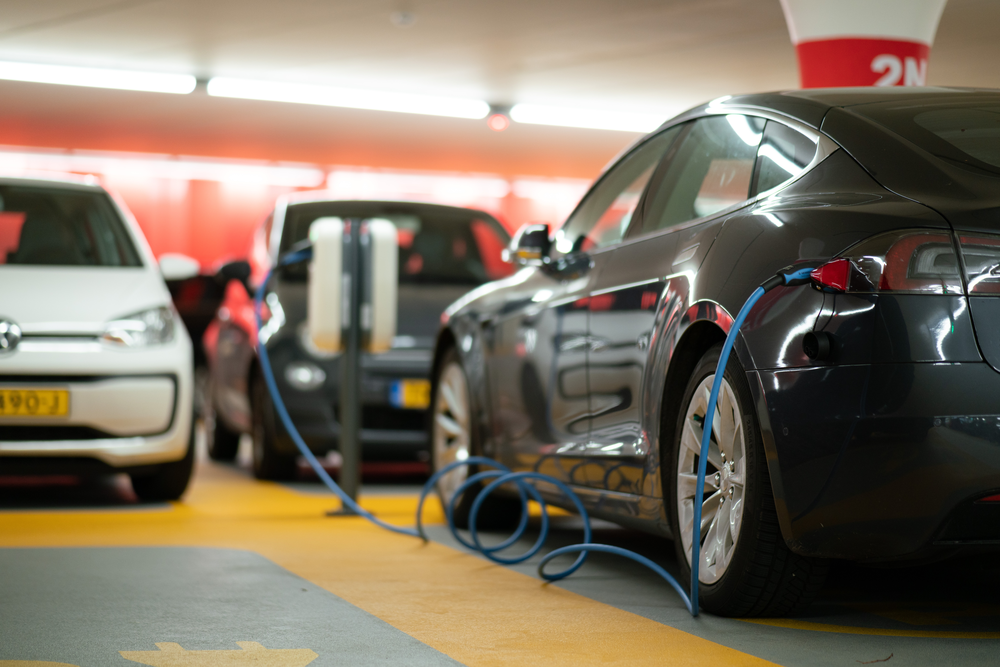

In [1]:
library(IRdisplay)
display_png(file = "image/Electric_charging.jpg")

# Business Understanding

<font size="1.5"> A transportation and logistics company wants to migrate its fleet to electric cars in order to reduce costs.<p>Before making the decision, the company would like to predict the energy consumption of electric cars based on various usage factors and vehicle characteristics.<p>I must build a Machine Learning model capable of predicting the energy consumption of electric cars based on various factors, such as the type and number of electric motors in the vehicle, vehicle weight, load capacity, among other attributes.<p>The goal is to create a Machine Learning model with a maximum of 15% MAPE. (Mean Absolute Percentage Error).</font>

# Packages

In [43]:
suppressPackageStartupMessages({
    library(readxl)        # read Excel files
    library(tidyverse)     # a set of libraries for data analysis
    library(ggplot2)       # create graphics
    library(gridExtra)     # organize graphics in a grid format
    library(GGally)        # creating graphical displays of pairwise relationships in data
    library(randomForest)  # implementing the Random Forest algorithm
    library(caret)         # training and evaluating machine learning models
    library(Metrics)       # evaluating model performance metrics
    library(xgboost)       # loading the "xgboost" package in R
})

# Data Understanding

## Loading Data

In [3]:
df_raw <- read_excel("data/FEV-data-Excel.xlsx")

## Rename columns

In [4]:
df1 <- df_raw

# Selecting column names 
p <- colnames(df1)

# Removing spaces and special characters
p <- gsub("_+", "_", gsub("[^[:alpha:]]", "_", p))

# Modifying column names
colnames(df1) <- p

## Data Dimensions

In [5]:
d <- dim(df1)
print(paste("Number of rowns:",d[1],"| Number of columns:",d[2]))

[1] "Number of rowns: 53 | Number of columns: 25"


## Check NA

In [6]:
print(paste("Number of NA:",sum(is.na(df1))))

[1] "Number of NA: 30"


## Data Types

In [7]:
str(df1)

tibble [53 × 25] (S3: tbl_df/tbl/data.frame)
 $ Car_full_name                  : chr [1:53] "Audi e-tron 55 quattro" "Audi e-tron 50 quattro" "Audi e-tron S quattro" "Audi e-tron Sportback 50 quattro" ...
 $ Make                           : chr [1:53] "Audi" "Audi" "Audi" "Audi" ...
 $ Model                          : chr [1:53] "e-tron 55 quattro" "e-tron 50 quattro" "e-tron S quattro" "e-tron Sportback 50 quattro" ...
 $ Minimal_price_gross_PLN_       : num [1:53] 345700 308400 414900 319700 357000 ...
 $ Engine_power_KM_               : num [1:53] 360 313 503 313 360 503 170 184 286 136 ...
 $ Maximum_torque_Nm_             : num [1:53] 664 540 973 540 664 973 250 270 400 260 ...
 $ Type_of_brakes                 : chr [1:53] "disc (front + rear)" "disc (front + rear)" "disc (front + rear)" "disc (front + rear)" ...
 $ Drive_type                     : chr [1:53] "4WD" "4WD" "4WD" "4WD" ...
 $ Battery_capacity_kWh_          : num [1:53] 95 71 95 71 95 95 42.2 42.2 80 50 ...
 $ Range_

## Change Types

In [8]:
# Converting columns into a factor
df1$Type_of_brakes <- as.factor(df1$Type_of_brakes)
df1$Drive_type <- as.factor(df1$Drive_type)

## Data Summary

In [9]:
summary(df1)

 Car_full_name          Make              Model          
 Length:53          Length:53          Length:53         
 Class :character   Class :character   Class :character  
 Mode  :character   Mode  :character   Mode  :character  
                                                         
                                                         
                                                         
                                                         
 Minimal_price_gross_PLN_ Engine_power_KM_ Maximum_torque_Nm_
 Min.   : 82050           Min.   : 82.0    Min.   : 160      
 1st Qu.:142900           1st Qu.:136.0    1st Qu.: 260      
 Median :178400           Median :204.0    Median : 362      
 Mean   :246158           Mean   :269.8    Mean   : 460      
 3rd Qu.:339480           3rd Qu.:372.0    3rd Qu.: 640      
 Max.   :794000           Max.   :772.0    Max.   :1140      
                                                             
                    Type_of_brakes      

## Handle NaN values

In [10]:
# check NA
colSums(is.na(df1))

Car_full_name                            Make 
                              0                               0 
                          Model        Minimal_price_gross_PLN_ 
                              0                               0 
               Engine_power_KM_              Maximum_torque_Nm_ 
                              0                               0 
                 Type_of_brakes                      Drive_type 
                              1                               0 
          Battery_capacity_kWh_                  Range_WLTP_km_ 
                              0                               0 
                  Wheelbase_cm_                      Length_cm_ 
                              0                               0 
                      Width_cm_                      Height_cm_ 
                              0                               0 
       Minimal_empty_weight_kg_    Permissable_gross_weight_kg_ 
                              0                               8 
      Maximum_load_capacity_kg_                 Number_of_seats 
                              8                               0 
                Number_of_doors                   Tire_size_in_ 
                              0                               0 
             Maximum_speed_kph_            Boot_capacity_VDA_l_ 
                              0                               1 
            Acceleration_kph_s_   Maximum_DC_charging_power_kW_ 
                              3                               0 
mean_Energy_consumption_kWh_km_ 
                              9

In [11]:
# Removing NA's from the target variable.
df2 = drop_na(df1, mean_Energy_consumption_kWh_km_)

In [12]:
# Removing columns with NA's
drop <- c("Boot_capacity_VDA_l_", "Acceleration_kph_s_")
df2 <- df2[,!colnames(df2) %in% drop]

In [13]:
# Filling NA's with disc (front + rear)
df2$Type_of_brakes[is.na(df2$Type_of_brakes)] <- "disc (front + rear)"

In [14]:
sum(colSums(is.na(df2)))

[1] 0

# Exploratory Data Analysis


In [15]:
# creating a new data frame
df4<-df2

## Univariate analysis

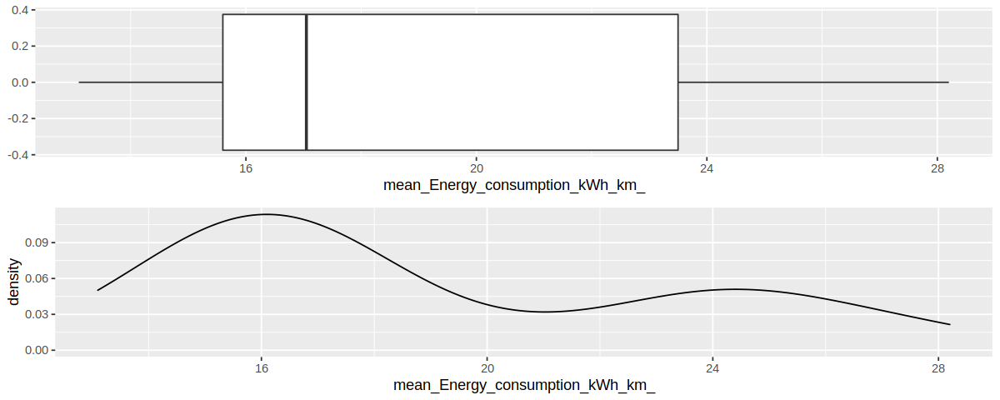

In [16]:
# Creating a boxplot and density plot for the variable target
p <- df4 %>%
     ggplot(mapping = aes(x = mean_Energy_consumption_kWh_km_))
     options(repr.plot.width = 10, repr.plot.height = 4)

p1 <- p + geom_boxplot()
p2 <- p + geom_density()

PlotsList<- list(p1,p2)
grid.arrange(grobs = PlotsList, ncol = 1)

## Bivariate Analysis

### Numerical Variables

In [17]:
# Selecting only the numeric columns
df_num <- select_if(df4, is.numeric)

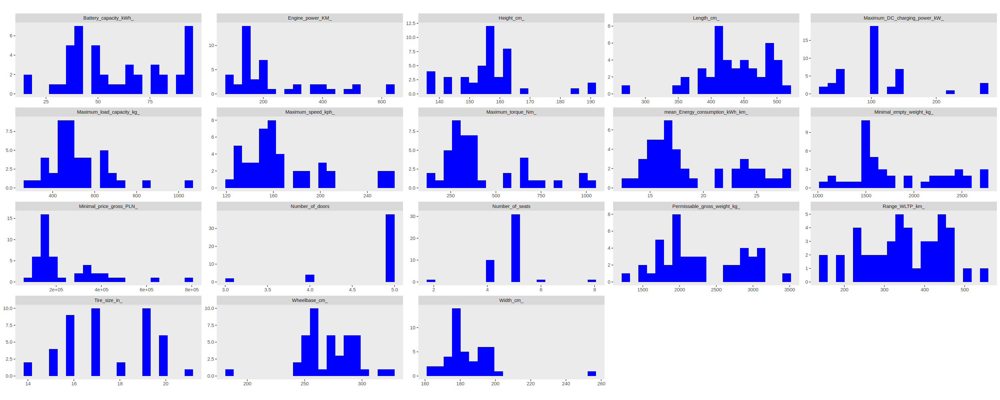

In [18]:
# histogram plot for each numeric variable
options(repr.plot.width = 25, repr.plot.height = 10)
df_num %>% 
  gather(key = Variable, value = Value) %>% 
  ggplot() +
    geom_histogram(aes(x = Value), bins = 20, fill='blue') +
    facet_wrap(~Variable, scales='free') +
    theme_grey() +
    theme(aspect.ratio = 0.4, axis.title = element_blank(),panel.grid = element_blank())

#### Visualizing Feature relationships with a scatterplot matrix

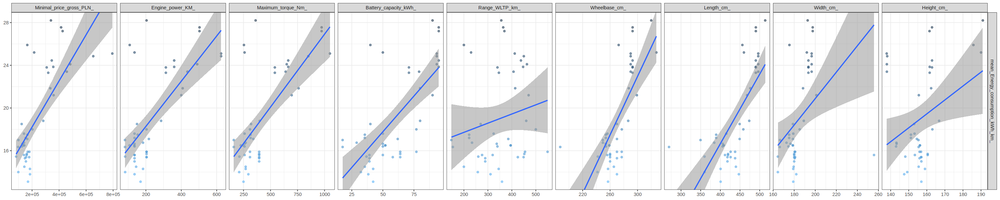

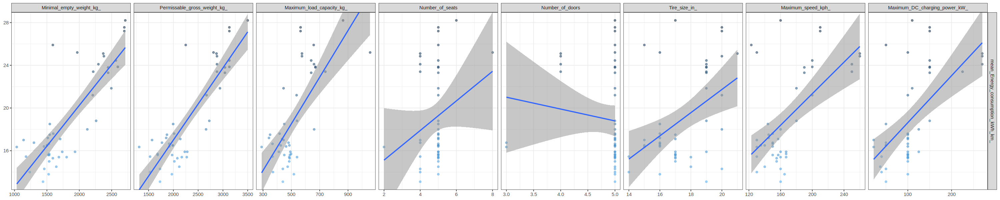

In [19]:
#Correlation between the predictor variables and the target variable
options(repr.plot.width = 25, repr.plot.height = 5)
p1 <- ggduo(data = select_if(df4, is.numeric), 
      columnsX = 1:9, 
      columnsY = 18, 
      types = list(continuous = "smooth_lm"),
      mapping = ggplot2::aes(color = -mean_Energy_consumption_kWh_km_, alpha = 0.3)
      ) +
  theme_bw()

p2 <- ggduo(data = select_if(df4, is.numeric), 
      columnsX = 10:17, 
      columnsY = 18, 
      types = list(continuous = "smooth_lm"),
      mapping = ggplot2::aes(color = -mean_Energy_consumption_kWh_km_, alpha = 0.3)
      ) +
  theme_bw()

print(p1)
print(p2)

### Categorical Variable

#### Make

In [20]:
table(df4$Make)


         Audi           BMW       Citroën            DS         Honda 
            6             3             1             1             2 
      Hyundai        Jaguar           Kia         Mazda Mercedes-Benz 
            3             1             4             1             2 
         Mini        Nissan          Opel       Peugeot       Porsche 
            1             3             2             1             4 
      Renault         Skoda         Smart    Volkswagen 
            2             1             2             4 

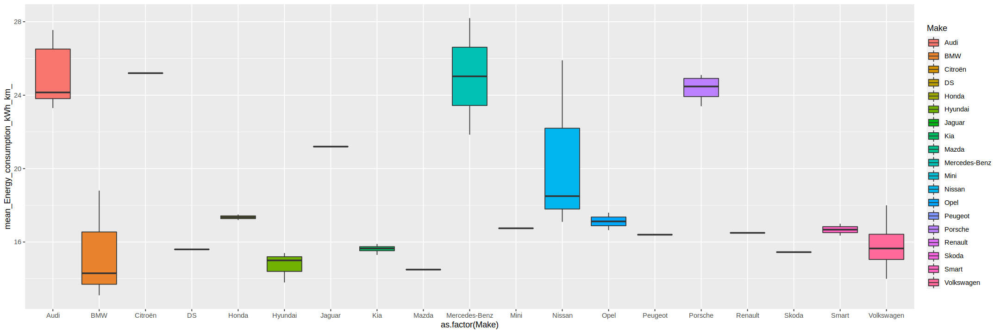

In [21]:
p <- ggplot(df4) +
  geom_boxplot(aes(x = as.factor(Make), y = mean_Energy_consumption_kWh_km_, fill = Make))
  options(repr.plot.width = 18, repr.plot.height = 6)
p

#### Model             

In [22]:
table(df4$Model)


                 Citigo-e iV                    Cooper SE 
                           1                            1 
                     Corsa-e        DS3 Crossback e-tense 
                           1                            1 
                           e                    e Advance 
                           1                            1 
                       e-208               e-Niro 39.2kWh 
                           1                            1 
                e-Niro 64kWh               e-NV200 evalia 
                           1                            1 
              e-Soul 39.2kWh                 e-Soul 64kWh 
                           1                            1 
           ë-Spacetourer (M)            e-tron 50 quattro 
                           1                            1 
           e-tron 55 quattro             e-tron S quattro 
                           1                            1 
 e-tron Sportback 50 quattro  e-tron Sportback 55 quatt

#### Type of brakes            

In [23]:
table(df4$Type_of_brakes)


       disc (front + rear) disc (front) + drum (rear) 
                        37                          7 

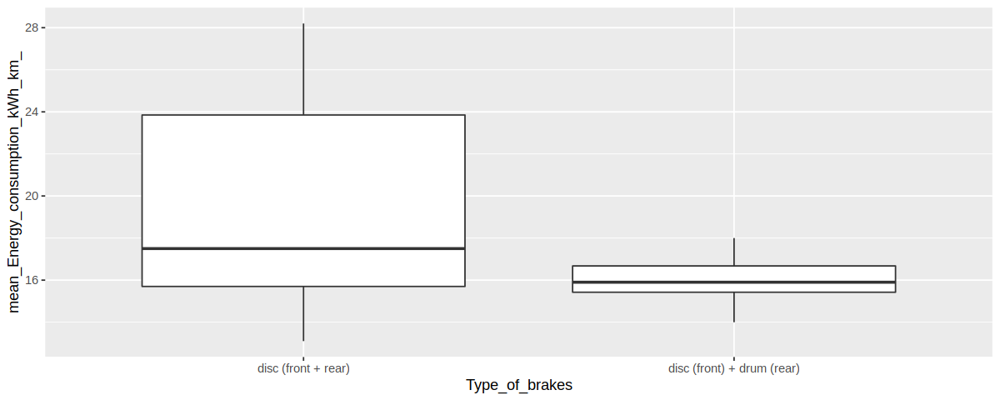

In [24]:
p <- df4 %>%
     ggplot(mapping = aes(x= Type_of_brakes, y = mean_Energy_consumption_kWh_km_))
     options(repr.plot.width = 10, repr.plot.height = 4)
p + geom_boxplot()

#### Drive type

In [25]:
table(df4$Drive_type)


2WD (front)  2WD (rear)         4WD 
         22          10          12 

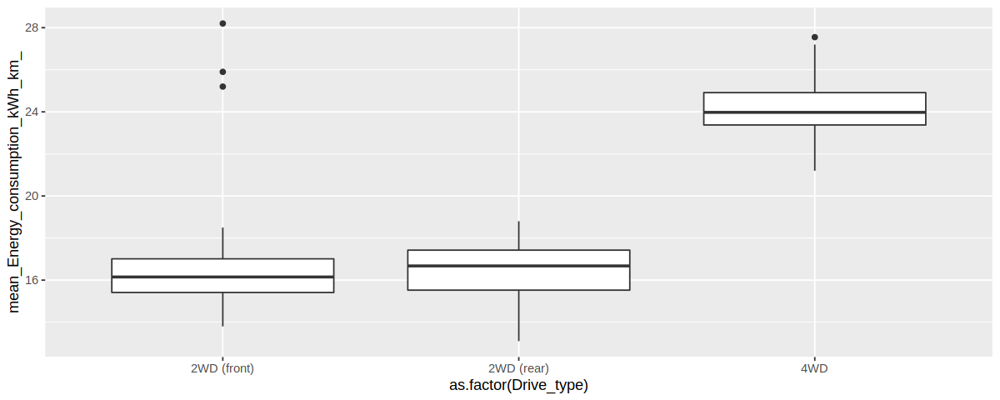

In [26]:
p <- df4 %>%
     ggplot(mapping = aes(x= as.factor(Drive_type), y = mean_Energy_consumption_kWh_km_))
     options(repr.plot.width = 10, repr.plot.height = 4)
p + geom_boxplot()

## EDA - Conclusion

<font size="1.5">I decided to remove the categorical variables **'Car_full_name','Make','Model'**, as they do not provide significant information to determine the average consumption of electric cars.</font>

<font size="1.5">The variables **'Number_of_seats', 'Number_of_doors'**, and **'Tire_size_in_**' do not significantly contribute to explaining the model's response variable."</font>

<font size="1.5">I excluded the variable **'Minimal_price_gross_PLN_'** because the model should predict only based on technical aspects of the vehicle, and not financial ones.</font>

## Correlations

<font size="1.5">The predictor variables show a high degree of multicollinearity.</font>

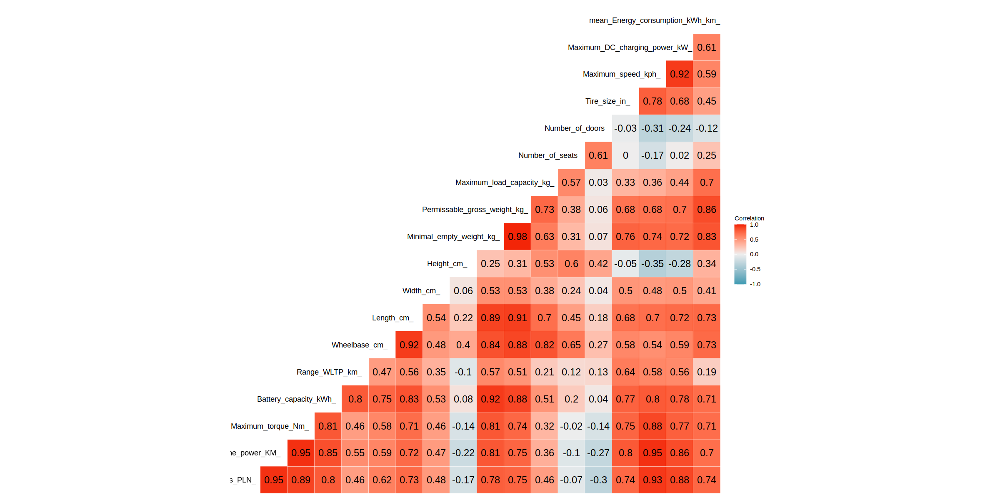

In [27]:
# Plot correlation heatmap
options(repr.plot.width=20, repr.plot.height=10)
ggcorr(df_num, label = TRUE, palette = "RdGy", name = "Correlation", hjust = 0.9, label_size = 5, label_round = 2) 

# Data Preparation


<font size="1.5">No data transformation will be performed at this time. <p>If the MAPE goal of <15% is not achieved, data transformation will be performed in the next iteration.</font>

## Feature Selection

<font size="1.5">The dataset shows a high degree of multicollinearity, so I will use a Random Forest which is not affected by multicollinearity.</font>

In [28]:
# drop features
to_drop <- c('Car_full_name','Make','Model','Minimal_price_gross_PLN_')
df5 <- df4[,!colnames(df4) %in% to_drop]

In [29]:
#Training a random forest to select the best features.
set.seed(42)
f_model <- randomForest(mean_Energy_consumption_kWh_km_ ~., df5, ntree = 1000)

featureImportance <- f_model$importance
featureImportance <- featureImportance[order(featureImportance, decreasing = TRUE), ]

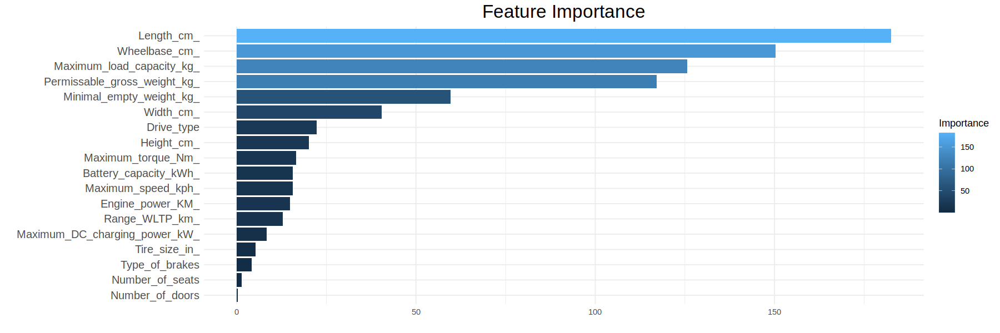

In [30]:
# Cria um data frame para o gráfico com os dados de importância das variáveis
df_importancia <- data.frame(Variables = names(featureImportance),
                             Importance = featureImportance)

# Cria o gráfico de barras usando ggplot2
options(repr.plot.width = 15, repr.plot.height = 5)
ggplot(df_importancia, aes(x = reorder(Variables, Importance), y = Importance, fill = Importance)) +
  geom_bar(stat = "identity", width = 0.9) +
  coord_flip() +
  labs(title = "Feature Importance", x = "", y = "") +
  theme_minimal() +
  theme(axis.text.y = element_text(angle = 0, hjust = 1, vjust = 0.5, size = 12),
        plot.title = element_text(hjust = 0.5, size = 20))

In [31]:
# Create a data frame with the best features.
top_features = 5
best_features <- names(featureImportance[1:top_features])

final_df <- df4[,colnames(df4) %in% best_features]
final_df['mean_Energy_consumption_kWh_km_'] <- df4['mean_Energy_consumption_kWh_km_']  

## Split Train and Test

In [34]:
#Split 80% for testing and 20% for training.
set.seed(42)
index <- createDataPartition(final_df$mean_Energy_consumption_kWh_km_, p=0.8, list = FALSE) 
df_train <- final_df[index,]
df_test <- final_df[-index,]

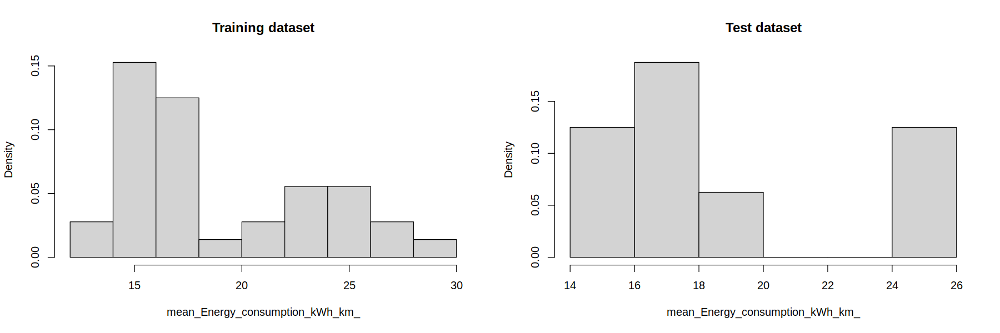

In [35]:
# Check distributtion of training set and test set
par(mfrow = c(1, 2))
hist(df_train$mean_Energy_consumption_kWh_km_, main = "Training dataset", xlab = "mean_Energy_consumption_kWh_km_", freq = FALSE)
hist(df_test$mean_Energy_consumption_kWh_km_, main = "Test dataset", xlab = "mean_Energy_consumption_kWh_km_", freq = FALSE)

In [36]:
# Print summary statistics for training and test set
bind_rows(summary(df_train$mean_Energy_consumption_kWh_km_), summary(df_train$mean_Energy_consumption_kWh_km_)) %>%
as_tibble() %>%
add_column(Subset = c("Train", "Test"), .before = 1)

Subset,Min.,1st Qu.,Median,Mean,3rd Qu.,Max.
<chr>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>,<table[1d]>
Train,13.1,15.6,16.925,19.08472,23.5,28.2
Test,13.1,15.6,16.925,19.08472,23.5,28.2


# Modeling 


## Fitting Models Without Parameter Tuning

### Single Performance

#### Average Model

In [39]:
#My baseline model will be a mean model.

#Model
yhat_average = mean(df_train$mean_Energy_consumption_kWh_km_)

GS_T0 <- Sys.time()

# metrics
MAE  <- mae (df_test$mean_Energy_consumption_kWh_km_,yhat_average)
RMSE <- rmse(df_test$mean_Energy_consumption_kWh_km_,yhat_average)
MAPE <- mape(df_test$mean_Energy_consumption_kWh_km_,yhat_average)

GS_T1 <- Sys.time()
time = GS_T1-GS_T0

#Create a data frame with the metrics
resultados_avg <- data.frame(MODEL = "Average Model", MAE = MAE, RMSE = RMSE, MAPE = MAPE, TIME = time)

#Show the result
print(resultados_avg)

          MODEL      MAE     RMSE      MAPE            TIME
1 Average Model 3.467361 3.951133 0.1868655 0.04199862 secs


#### Linear Regression Model

In [40]:
GS_T0 <- Sys.time()

#Model
lm_model <- lm(mean_Energy_consumption_kWh_km_ ~., data = df_train)

# Predict
yhat_lm <- predict(lm_model, newdata = df_test)

# metrics
MAE  <- mae (df_test$mean_Energy_consumption_kWh_km_,yhat_lm)
RMSE <- rmse(df_test$mean_Energy_consumption_kWh_km_,yhat_lm)
MAPE <- mape(df_test$mean_Energy_consumption_kWh_km_,yhat_lm)

GS_T1 <- Sys.time()
time = GS_T1-GS_T0


#Create a data frame with the metrics
resultados_lm <- data.frame(MODEL = "Linear Regression Model", MAE = MAE, RMSE = RMSE, MAPE = MAPE, TIME = time)

#Show the result
print(resultados_lm)

                    MODEL      MAE     RMSE      MAPE            TIME
1 Linear Regression Model 2.067221 2.514567 0.1063807 0.00541997 secs


#### Random Forest Regressor

In [41]:
GS_T0 <- Sys.time()

# Model
rf <- randomForest(mean_Energy_consumption_kWh_km_ ~ ., data = df_train, ntree = 100)

# Predict
yhat_rf <- predict(rf, newdata = df_test)

# metrics
MAE  <- mae (df_test$mean_Energy_consumption_kWh_km_,yhat_rf )
RMSE <- rmse(df_test$mean_Energy_consumption_kWh_km_,yhat_rf )
MAPE <- mape(df_test$mean_Energy_consumption_kWh_km_,yhat_rf )

GS_T1 <- Sys.time()
time = GS_T1-GS_T0

#Create a data frame with the metrics
resultados_rf <- data.frame(MODEL = "Random Forest Regressor", MAE = MAE, RMSE = RMSE, MAPE = MAPE, TIME = time)

#Show the result
print(resultados_rf)

                    MODEL      MAE     RMSE       MAPE             TIME
1 Random Forest Regressor 1.444353 1.618416 0.07980073 0.008270741 secs


#### XGBoost Regressor - gblinear

In [44]:
GS_T0 <- Sys.time()

# DMatrix format (accepted format by XGBoost)
dtrain <- xgb.DMatrix(data = as.matrix(df_train[, -1]), label = df_train$mean_Energy_consumption_kWh_km_)
dtest <- xgb.DMatrix(data = as.matrix(df_test[, -1]), label = df_test$mean_Energy_consumption_kWh_km_)

# set parameters
params <- list(
               booster= 'gblinear',
               objective = "reg:squarederror",
               eval_metric = "rmse"
               )

# model
xgb <- xgboost(params = params, data = dtrain, nrounds = 200,verbose = FALSE)

# predict
yhat_xgb <- predict(xgb, dtest)

GS_T1 <- Sys.time()
time = GS_T1-GS_T0

# metrics
MAE  <- mae (df_test$mean_Energy_consumption_kWh_km_,yhat_xgb )
RMSE <- rmse(df_test$mean_Energy_consumption_kWh_km_,yhat_xgb )
MAPE <- mape(df_test$mean_Energy_consumption_kWh_km_,yhat_xgb )

#Create a data frame with the metrics
resultados_xgb_linear <- data.frame(MODEL = "XGBoost Regressor (gblinear)", MAE = MAE, RMSE = RMSE, MAPE = MAPE, TIME = time)

# show the result
print(resultados_xgb_linear)

                         MODEL       MAE      RMSE     MAPE           TIME
1 XGBoost Regressor (gblinear) 0.5315435 0.6912959 0.027453 0.1377664 secs


#### XGBoost Regressor - gbtree

In [45]:
GS_T0 <- Sys.time()

# DMatrix format (accepted format by XGBoost)
dtrain <- xgb.DMatrix(data = as.matrix(df_train[, -1]), label = df_train$mean_Energy_consumption_kWh_km_)
dtest <- xgb.DMatrix(data = as.matrix(df_test[, -1]), label = df_test$mean_Energy_consumption_kWh_km_)

# set parameters
params <- list(
               booster= 'gbtree',
               objective = "reg:squarederror",
               eval_metric = "rmse"
               )

# model
xgb <- xgboost(params = params, data = dtrain, nrounds = 200,verbose = FALSE)

# predict
yhat_xgb <- predict(xgb, dtest)

GS_T1 <- Sys.time()
time = GS_T1-GS_T0

# metrics
MAE  <- mae (df_test$mean_Energy_consumption_kWh_km_,yhat_xgb )
RMSE <- rmse(df_test$mean_Energy_consumption_kWh_km_,yhat_xgb )
MAPE <- mape(df_test$mean_Energy_consumption_kWh_km_,yhat_xgb )

# Create a data frame with the metrics
resultados_xgb_gbtree <- data.frame(MODEL = "XGBoost Regressor (gbtree)", MAE = MAE, RMSE = RMSE, MAPE = MAPE, TIME = time)
#resultados_totais <- rbind(resultados_totais, resultados)

# show thw results
print(resultados_xgb_gbtree)

                       MODEL       MAE      RMSE       MAPE           TIME
1 XGBoost Regressor (gbtree) 0.2938099 0.3180289 0.01615741 0.1047573 secs


### Cross Validation

In [46]:
# Define the parameters for cross-validation
num_folds <- 5  # Number of folds
repeats   <- 10  # Number of repetitions

# set parameters
cv_method <- trainControl(method = "repeatedcv",   # Cross-validation method (repeatedcv for repeated cross-validation)
                          number = num_folds,      # Número de folds
                          repeats = repeats,       # Number of repetitions
                          savePredictions = TRUE,  # Save predictions for error calculation
                          verboseIter = FALSE)     # Display progress information

#### Linear Regression Model CV

In [47]:
GS_T0 <- Sys.time()

# set params (caret)
lm_model_cv <- train(mean_Energy_consumption_kWh_km_ ~.,     
                     data = df_train,                        
                     method = "lm",                          
                     trControl = cv_method,                  
                     metric = "RMSE")                        

# predict
yhat_lm_cv <- predict(lm_model_cv, newdata = df_test)

GS_T1 <- Sys.time()
time = GS_T1-GS_T0

# metrics
MAE  <- mae (df_test$mean_Energy_consumption_kWh_km_,yhat_lm_cv)
RMSE <- rmse(df_test$mean_Energy_consumption_kWh_km_,yhat_lm_cv)
MAPE <- mape(df_test$mean_Energy_consumption_kWh_km_,yhat_lm_cv)

# Create a data frame with the metrics
result_lr_cv <- data.frame(MODEL = "Linear Regression Model_CV", MAE = MAE, RMSE = RMSE, MAPE = MAPE, TIME = time)

# show the Results
print(result_lr_cv)

                       MODEL      MAE     RMSE      MAPE           TIME
1 Linear Regression Model_CV 2.067221 2.514567 0.1063807 0.5362101 secs


#### Random Forest Regressor CV

In [48]:
GS_T0 <- Sys.time()

# set params (caret)
rf_model_cv <- train(mean_Energy_consumption_kWh_km_ ~.,     # Fórmula do modelo
                     data = df_train,                        # Dados de treinamento
                     method = "rf",                          # Método de modelagem (regressão linear)
                     trControl = cv_method,                  # Configurações de validação cruzada
                     metric = "RMSE",                        # Métrica de avaliação do modelo (RMSE) 
                     ntree = 100)                        

# Predict
yhat_rf_cv <- predict(rf_model_cv, newdata = df_test)

GS_T1 <- Sys.time()
time = GS_T1-GS_T0

# metrics
MAE  <- mae (df_test$mean_Energy_consumption_kWh_km_,yhat_rf_cv)
RMSE <- rmse(df_test$mean_Energy_consumption_kWh_km_,yhat_rf_cv)
MAPE <- mape(df_test$mean_Energy_consumption_kWh_km_,yhat_rf_cv)

# Create a data frame with the metrics
result_rf_cv <- data.frame(MODEL = "Random Forest Regressor_CV", MAE = MAE, RMSE = RMSE, MAPE = MAPE, TIME = time)

# Show the Results
print(result_rf_cv)

                       MODEL      MAE    RMSE       MAPE           TIME
1 Random Forest Regressor_CV 1.577288 1.84874 0.08526897 0.8658793 secs


#### XGBoost Regressor CV - gblinear

In [49]:
GS_T0 <- Sys.time()

# set params (caret)
params <- list(
               booster= 'gblinear',
               objective = "reg:squarederror",
               eval_metric = "rmse"
 
)
# Predict
bst.cv <- xgb.cv(data = dtrain, 
              params = params,
              metrics = list("mae","rmse","mape"),
              nrounds = 100, 
              nfold =5,
              print_every_n = 20,
              verbose = FALSE)

GS_T1 <- Sys.time()
time = GS_T1-GS_T0

# metrics
MAE  <- mean(bst.cv$evaluation_log$test_mae_mean)
RMSE <- mean(bst.cv$evaluation_log$test_rmse_mean)
MAPE <- mean(bst.cv$evaluation_log$test_mape_mean)

# Create a data frame with the metrics
result_xgb_cv <- data.frame(MODEL = "XGBoost Regressor_CV (gblinear)", MAE = MAE, RMSE = RMSE, MAPE = MAPE, TIME = time)

# show the results
print(result_xgb_cv)

                            MODEL      MAE     RMSE       MAPE           TIME
1 XGBoost Regressor_CV (gblinear) 1.681655 1.964044 0.09059665 0.1318483 secs


#### XGBoost Regressor CV - gbtree

In [50]:
GS_T0 <- Sys.time()

# Definir os parâmetros do modelo XGBoost
params <- list(
               booster= 'gbtree',
               objective = "reg:squarederror",
               eval_metric = "rmse"
               )
# Predict
bst.cv <- xgb.cv(data = dtrain, 
              params = params,
              metrics = list("mae","rmse","mape"),
              nrounds = 100, 
              nfold =5,
              print_every_n = 20,
              verbose = FALSE)
GS_T1 <- Sys.time()
time = GS_T1-GS_T0

# metrics
MAE  <- mean(bst.cv$evaluation_log$test_mae_mean)
RMSE <- mean(bst.cv$evaluation_log$test_rmse_mean)
MAPE <- mean(bst.cv$evaluation_log$test_mape_mean)

# Create a data frame with the metrics
result_xgb_tree_cv <- data.frame(MODEL = "XGBoost Regressor_CV (gbtree)", MAE = MAE, RMSE = RMSE, MAPE = MAPE, TIME = time)

# Show the results
print(result_xgb_tree_cv)

                          MODEL      MAE    RMSE      MAPE           TIME
1 XGBoost Regressor_CV (gbtree) 1.052148 1.44992 0.0518484 0.1810412 secs


## Comparison of model performance

### Single Performance

In [51]:
# create a empty data frame
Summary_sp <- data.frame(MODEL = character(),
                                MAE   = numeric(),
                                MAPE  = numeric(),
                                RMSE  = numeric(),
                                TIME  = character(),
                                stringsAsFactors = FALSE)

# Adding the results.
Summary_sp <- rbind(Summary_sp, resultados_avg,resultados_lm,resultados_rf, resultados_xgb_gbtree, resultados_xgb_linear)

# sort by RMSE
Summary_sp <- Summary_sp[order(Summary_sp$MAPE), ]

# show data frame
Summary_sp

,MODEL,MAE,RMSE,MAPE,TIME
,<chr>,<dbl>,<dbl>,<dbl>,<drtn>
4,XGBoost Regressor (gbtree),0.2938099,0.3180289,0.01615741,0.104757309 secs
5,XGBoost Regressor (gblinear),0.5315435,0.6912959,0.02745300,0.137766361 secs
3,Random Forest Regressor,1.4443530,1.6184158,0.07980073,0.008270741 secs
2,Linear Regression Model,2.0672215,2.5145671,0.10638074,0.005419970 secs
1,Average Model,3.4673611,3.9511326,0.18686552,0.041998625 secs


### Cross Validation Perfromance

In [52]:
# create a empty data frame
Summary_cv <- data.frame(MODEL = character(),
                                MAE   = numeric(),
                                MAPE  = numeric(),
                                RMSE  = numeric(),
                                TIME  = character(), 
                                stringsAsFactors = FALSE)

# Adding the results.
Summary_cv <- rbind(Summary_cv, result_lr_cv, result_rf_cv, result_xgb_cv, result_xgb_tree_cv )

# sort by RMSE
Summary_cv <- Summary_cv[order(Summary_cv$RMSE), ]

# show data frame
Summary_cv

,MODEL,MAE,RMSE,MAPE,TIME
,<chr>,<dbl>,<dbl>,<dbl>,<drtn>
4,XGBoost Regressor_CV (gbtree),1.052148,1.449920,0.05184840,0.1810412 secs
2,Random Forest Regressor_CV,1.577288,1.848740,0.08526897,0.8658793 secs
3,XGBoost Regressor_CV (gblinear),1.681655,1.964044,0.09059665,0.1318483 secs
1,Linear Regression Model_CV,2.067221,2.514567,0.10638074,0.5362101 secs


## Hyperparameter Fine Tuning

### Random Serach

In [53]:
set.seed(42)

GS_T0 <- Sys.time()

# Defining the training dataset
data <- as.data.frame(df_train)

# Defining the hyperparameter grid for the random search
param_grid <- expand.grid(nrounds          = 100,
                          max_depth        = c(3, 6, 9, 12),
                          eta              = c(0.01, 0.05, 0.1, 0.3),
                          gamma            = c(0, 0.1, 0.5, 1),
                          colsample_bytree = c(0.5, 0.75, 1),
                          min_child_weight = c(1, 3, 5),
                          subsample        = c(0.5, 0.75, 1)
                          )

# set the trainControl
train_control <- trainControl(method = "repeatedcv",
                              number = 5,
                              verboseIter = FALSE,
                              returnData = FALSE,
                              returnResamp = "all",
                              classProbs = FALSE,
                              allowParallel = TRUE,
                              )

# select the model
model <- train(x = data[, -length(df_train)],
               y = data[, length(df_train)],
               method = 'xgbTree',
               trControl = train_control,
               tuneGrid = param_grid,
               verbose = FALSE)

# best tune
best_tune <- model$bestTune

# best result
best_result <- model$results[which.min(model$results$RMSE),]

GS_T1 <- Sys.time()
GS_T1-GS_T0

Time difference of 3.792451 mins

In [54]:
best_result

,eta,max_depth,gamma,colsample_bytree,min_child_weight,subsample,nrounds,RMSE,Rsquared,MAE,RMSESD,RsquaredSD,MAESD
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1417,0.3,6,0,0.75,3,0.5,100,1.822067,0.821303,1.229718,1.09231,0.238065,0.4905481


In [55]:
# Salve the best tune
#saveRDS(best_tune, file = "objects/best_tune.RDS")

## Final Model

In [56]:
# load the best tune
best_tune2 <- readRDS("objects/best_tune.RDS")

In [57]:
set.seed(42)

GS_T0 <- Sys.time()

# Defining the training dataset
data <- as.data.frame(df_train)

# hyperparameter grid for the random search
param_grid <- expand.grid(nrounds          = best_tune2$nrounds,
                          max_depth        = best_tune2$max_depth,
                          eta              = best_tune2$eta,
                          gamma            = best_tune2$gamma,
                          colsample_bytree = best_tune2$colsample_bytree,
                          min_child_weight = best_tune2$min_child_weight,
                          subsample        = best_tune2$subsample
                          )

# set trainControl
train_control <- trainControl(method = "none",
                              number = 5,
                              verboseIter = FALSE,
                              returnData = FALSE,
                              returnResamp = "all",
                              classProbs = FALSE,
                              allowParallel = TRUE)

# Create the model
model <- train(x = data[, -length(df_train)],
               y = data[, length(df_train)],
               method = 'xgbTree',
               trControl = train_control,
               tuneGrid = param_grid,
               verbose = FALSE)

In [81]:
# Salvar o modelo em disco
#saveRDS(model, file = "objects/final_model")

In [82]:
final_model<- readRDS("objects/final_model")

### Evaluation


In [83]:
# crete a df
df_eval <- df_test

# Predictions with the trained model
final_predict <- predict(final_model, newdata = df_eval)

# Creating a data frame with predictions and residuals
df_eval$final_predict <- round(final_predict,1)
df_eval$residuals <- df_eval$mean_Energy_consumption_kWh_km_ - df_eval$final_predict

# show df
df_eval

Wheelbase_cm_,Length_cm_,Minimal_empty_weight_kg_,Permissable_gross_weight_kg_,Maximum_load_capacity_kg_,mean_Energy_consumption_kWh_km_,final_predict,residuals
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
270.0,437.5,1592,2080,488,15.30,17.0,-1.70
249.5,384.5,1300,1770,480,16.75,15.4,1.35
270.0,449.0,1545,1995,450,18.50,16.2,2.30
270.0,449.0,1705,2140,435,17.10,15.8,1.30
290.0,496.3,2380,2880,575,24.85,25.0,-0.15
249.4,349.5,1140,1570,445,17.00,15.7,1.30
241.7,360.0,1235,1530,370,14.00,15.9,-1.90
327.5,459.9,1969,2810,1056,25.20,21.5,3.70


In [84]:
# metrics
MAE  <- mae (df_eval$mean_Energy_consumption_kWh_km_,yhat_rf_cv)
RMSE <- rmse(df_eval$mean_Energy_consumption_kWh_km_,yhat_rf_cv)
MAPE <- mape(df_eval$mean_Energy_consumption_kWh_km_,yhat_rf_cv)

# Create a data frame with the metrics
final_model <- data.frame(MODEL = "XGBoost Regressor_CV (gbtree)", MAE = MAE, RMSE = RMSE, MAPE = MAPE)
print(final_model)

                          MODEL      MAE    RMSE       MAPE
1 XGBoost Regressor_CV (gbtree) 1.577288 1.84874 0.08526897


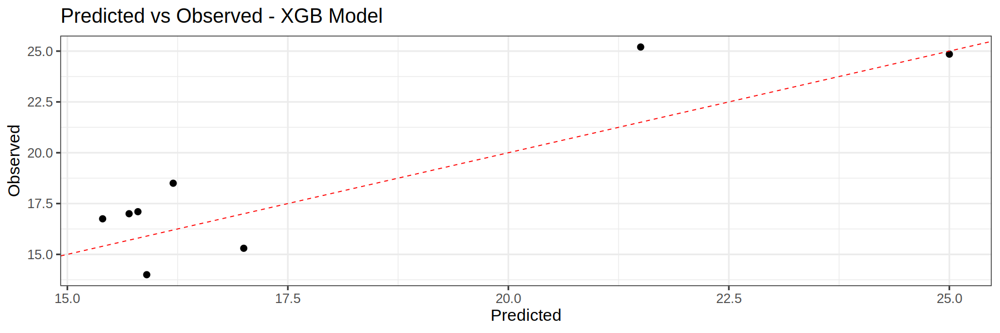

In [85]:
# Plot - Predicted vs Observed - XGB Model
ggplot(df_eval, aes(x = final_predict, y = mean_Energy_consumption_kWh_km_)) +
  geom_point(size = 3) +
  ylab("Observed")+
  xlab("Predicted")+
  geom_abline(slope = 1, intercept = 0, linetype = "dashed", color = "red") +
  theme_bw(base_size = 18, base_family = "Arial")+
  ggtitle("Predicted vs Observed - XGB Model")

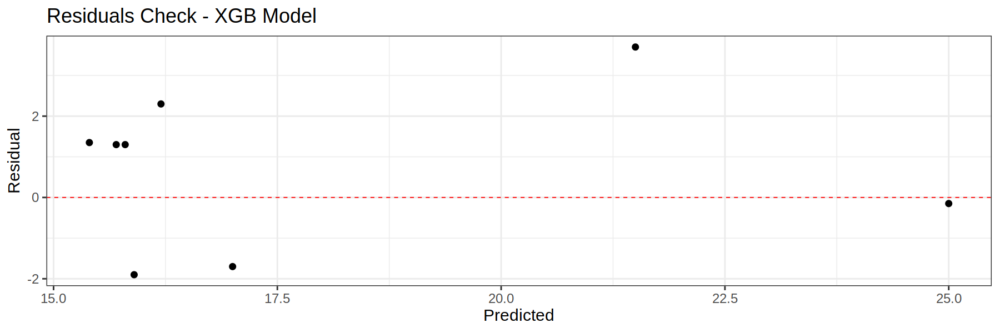

In [86]:
# Residuals Check - XGB Model
ggplot(df_eval, aes(x = final_predict, y = residuals)) +
  geom_point(size = 3) +
  ylab("Residual")+
  xlab("Predicted")+
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
  theme_bw(base_size = 18, base_family = "Arial")+
  ggtitle("Residuals Check - XGB Model")

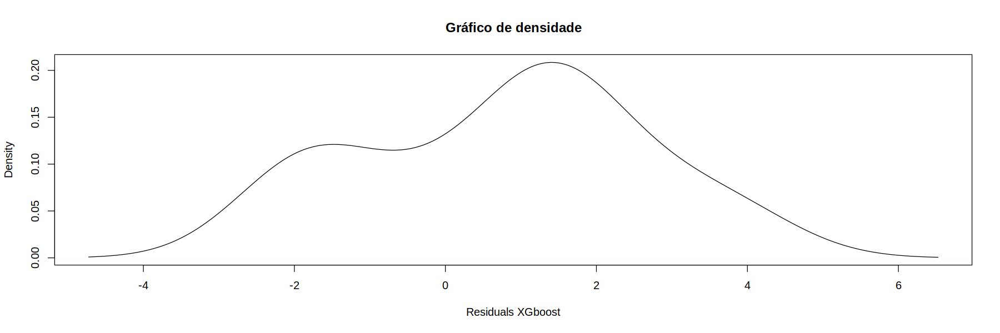

In [87]:
# error density
densidade <- density(df_eval$residuals)
plot(densidade, main="Gráfico de densidade", xlab="Residuals XGboost", ylab="Density")

# Conclusion

<font size="1.5">The objective of constructing a model with a maximum of 15% MAPE was successfully achieved using the XGBoost Regressor_CV (gbtree), without requiring any data transformations or the creation of new features.<p>When comparing the XGBoost Regressor_CV (gbtree) with the Baseline Model (Average Model), it's evident that the XGBoost outperformed the latter with a substantially superior result.</font>